# Import needed libraries

In [1]:
import os
import cv2
import time
import random
import numpy as np
from glob import glob
from tqdm import tqdm
from operator import add

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Create helper classes and functions

### Dataset class

In [2]:
class DriveDataset(Dataset):
    def __init__(self, images_path, masks_path):

        self.images_path = images_path
        self.masks_path = masks_path
        self.n_samples = len(images_path)

    def __getitem__(self, index):
        """ Reading image """
        image = cv2.imread(self.images_path[index], cv2.IMREAD_COLOR)
        image = image/255.0
        image = np.transpose(image, (2, 0, 1))
        image = image.astype(np.float32)
        image = torch.from_numpy(image)

        """ Reading mask """
        mask = cv2.imread(self.masks_path[index], cv2.IMREAD_GRAYSCALE)
        mask = mask/255.0
        mask = np.expand_dims(mask, axis=0)
        mask = mask.astype(np.float32)
        mask = torch.from_numpy(mask)

        return image, mask

    def __len__(self):
        return self.n_samples

### Unet helper classes

In [3]:
# Build Conv_layer
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

In [4]:
# Build Encoder section
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

In [5]:
# Build Decoder section
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x

In [ ]:
# Unet architecture
class build_unet(nn.Module):
    def __init__(self):
        super().__init__()

        # Encoder
        self.e1 = encoder_block(3, 64)
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        # Bottleneck
        self.b = conv_block(512, 1024)

        # Decoder
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)

        # Classifier
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0)
        
    def forward(self, inputs):
        # Encoder
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        # Bottleneck
        b = self.b(p4)

        # Decoder
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        outputs = self.outputs(d4)

        return outputs

### Losses classes

In [ ]:
# Dice Coefficient
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice

In [ ]:
# Dice Binary Cross Entropy Coefficient
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        inputs = torch.sigmoid(inputs)

        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss

        return Dice_BCE

### Function to seed the randomness

In [9]:
def seeding(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

### Function to create a new directory

In [10]:
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

### Function to calculate the taken time

In [11]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

### Function to train the model

In [12]:
def train(model, loader, optimizer, loss_fn, device):
    epoch_loss = 0.0

    model.train()
    for x, y in loader:
        x = x.to(device, dtype=torch.float32)
        y = y.to(device, dtype=torch.float32)

        optimizer.zero_grad()
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    epoch_loss = epoch_loss/len(loader)
    return epoch_loss

### Function to evaluate the model

In [13]:
def evaluate(model, loader, loss_fn, device):
    epoch_loss = 0.0

    model.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device, dtype=torch.float32)
            y = y.to(device, dtype=torch.float32)

            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            epoch_loss += loss.item()

        epoch_loss = epoch_loss / len(loader)
    return epoch_loss

# Data Preprocessing

### Get data paths

In [ ]:
seeding(42)

create_dir("files")

train_x = sorted(glob("/kaggle/input/retina-blood-vessel/Data/train/image/*"))
train_y = sorted(glob("/kaggle/input/retina-blood-vessel/Data/train/mask/*"))

valid_x = sorted(glob("/kaggle/input/retina-blood-vessel/Data/test/image/*"))
valid_y = sorted(glob("/kaggle/input/retina-blood-vessel/Data/test/mask/*"))

data_str = f"Dataset Size:\nTrain: {len(train_x)} - Valid: {len(valid_x)}\n"
print(data_str)

Dataset Size:
Train: 80 - Valid: 20



### Set hyperparameters

In [15]:
H = 512
W = 512
size = (H, W)
batch_size = 2
lr = 1e-4
checkpoint_path = "files/checkpoint.pth"

### Load dataset

In [16]:
train_dataset = DriveDataset(train_x, train_y)
valid_dataset = DriveDataset(valid_x, valid_y)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2
)

valid_loader = DataLoader(
    dataset=valid_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=2
)

# Unet Model

In [ ]:
# Set cuda device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = build_unet()
model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, verbose=True)
loss_fn = DiceBCELoss()

# Model Training

In [18]:
best_valid_loss = float("inf")
num_epochs = 50

for epoch in range(num_epochs):
    start_time = time.time()

    train_loss = train(model, train_loader, optimizer, loss_fn, device)
    valid_loss = evaluate(model, valid_loader, loss_fn, device)

    # Saving the model
    if valid_loss < best_valid_loss:
        print(f"Valid loss improved from {best_valid_loss:2.4f} to {valid_loss:2.4f}. Saving checkpoint: {checkpoint_path}")

        best_valid_loss = valid_loss
        torch.save(model.state_dict(), checkpoint_path)

    end_time = time.time()
    epoch_mins, epoch_secs = epoch_time(start_time, end_time)

    data_str = f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s\n'
    data_str += f'\tTrain Loss: {train_loss:.3f}\n'
    data_str += f'\tVal. Loss: {valid_loss:.3f}\n'
    print(data_str)

Valid loss improved from inf to 1.3115. Saving checkpoint: files/checkpoint.pth
Epoch: 01 | Epoch Time: 0m 13s
	Train Loss: 1.180
	Val. Loss: 1.311

Valid loss improved from 1.3115 to 0.9465. Saving checkpoint: files/checkpoint.pth
Epoch: 02 | Epoch Time: 0m 12s
	Train Loss: 0.986
	Val. Loss: 0.946

Valid loss improved from 0.9465 to 0.9119. Saving checkpoint: files/checkpoint.pth
Epoch: 03 | Epoch Time: 0m 12s
	Train Loss: 0.924
	Val. Loss: 0.912

Valid loss improved from 0.9119 to 0.8598. Saving checkpoint: files/checkpoint.pth
Epoch: 04 | Epoch Time: 0m 12s
	Train Loss: 0.875
	Val. Loss: 0.860

Valid loss improved from 0.8598 to 0.8107. Saving checkpoint: files/checkpoint.pth
Epoch: 05 | Epoch Time: 0m 12s
	Train Loss: 0.835
	Val. Loss: 0.811

Valid loss improved from 0.8107 to 0.7898. Saving checkpoint: files/checkpoint.pth
Epoch: 06 | Epoch Time: 0m 12s
	Train Loss: 0.802
	Val. Loss: 0.790

Valid loss improved from 0.7898 to 0.7455. Saving checkpoint: files/checkpoint.pth
Epoch: 0

In [19]:
jaccard = metrics_score[0] / len(test_x)
f1 = metrics_score[1] / len(test_x)
recall = metrics_score[2] / len(test_x)
precision = metrics_score[3] / len(test_x)
acc = metrics_score[4] / len(test_x)
print(f"Jaccard: {jaccard:1.4f} - F1: {f1:1.4f} - Recall: {recall:1.4f} - Precision: {precision:1.4f} - Acc: {acc:1.4f}")

NameError: name 'metrics_score' is not defined

In [20]:
!pip install onnx2keras

  Preparing metadata (setup.py) ... done
  Created wheel for onnx2keras: filename=onnx2keras-0.0.24-py3-none-any.whl size=24593 sha256=233af91fb2b54b612d1a4691ed1ffde87ca126bf5a5c205b6709cf62b621a9cb
  Stored in directory: /root/.cache/pip/wheels/a1/fb/c9/349c27912022d104c7dd5f5d272595c33b1b959c4468d5e784
Successfully built onnx2keras


In [ ]:
''' Saving the model'''

import torch
import onnx
import tensorflow as tf
from onnx2keras import onnx_to_keras

# Save PyTorch model
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
}, '/kaggle/working/blood_vessel_model.pth')

# Save as ONNX (intermediate format)
dummy_input = torch.randn(1, 3, 512, 512).to(device)
torch.onnx.export(model, 
                 dummy_input, 
                 "/kaggle/working/blood_vessel_model.onnx",
                 verbose=True,
                 input_names=['input'],
                 output_names=['output'])

# Convert ONNX to Keras and save as H5
onnx_model = onnx.load("/kaggle/working/blood_vessel_model.onnx")
k_model = onnx_to_keras(onnx_model, ['input'])
tf.keras.models.save_model(k_model, '/kaggle/working/blood_vessel_model.h5')

print("Models saved successfully!")

In [ ]:
torch.save(model.state_dict(), '/kaggle/working/blood_vessel_model.pth')

# Save entire model (architecture + weights)
torch.save(model, '/kaggle/working/blood_vessel_model_full.pth')

print("Model saved successfully!")

Model saved successfully!


# Testing

### Function to get metrics for evaluation

In [19]:
def calculate_metrics(y_true, y_pred):
    # Ground truth
    y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    # Prediction
    y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)
    score_f1 = f1_score(y_true, y_pred)
    score_recall = recall_score(y_true, y_pred)
    score_precision = precision_score(y_true, y_pred)
    score_acc = accuracy_score(y_true, y_pred)

    return [score_jaccard, score_f1, score_recall, score_precision, score_acc]

### Function to parse the mask

In [20]:
def mask_parse(mask):
    mask = np.expand_dims(mask, axis=-1)    ## (512, 512, 1)
    mask = np.concatenate([mask, mask, mask], axis=-1)  ## (512, 512, 3)
    return mask

### Get test data

In [ ]:

seeding(42)

create_dir("results")

test_x = sorted(glob("/kaggle/input/retina-blood-vessel/Data/test/image/*"))
test_y = sorted(glob("/kaggle/input/retina-blood-vessel/Data/test/mask/*"))

### Load checkpoints file

In [22]:
checkpoint_path = "files/checkpoint.pth"

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = build_unet()
model = model.to(device)
model.load_state_dict(torch.load(checkpoint_path, map_location=device))
model.eval()

build_unet(
  (e1): encoder_block(
    (conv): conv_block(
      (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (pool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (e2): encoder_block(
    (conv): conv_block(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (pool): MaxPool2d(kernel_size=(2, 2

In [23]:
metrics_score = [0.0, 0.0, 0.0, 0.0, 0.0]
time_taken = []

for i, (x, y) in tqdm(enumerate(zip(test_x, test_y)), total=len(test_x)):
    # Extract the name
    name = x.split("/")[-1].split(".")[0]

    # Reading image
    image = cv2.imread(x, cv2.IMREAD_COLOR) ## (512, 512, 3)
    x = np.transpose(image, (2, 0, 1))      ## (3, 512, 512)
    x = x/255.0
    x = np.expand_dims(x, axis=0)           ## (1, 3, 512, 512)
    x = x.astype(np.float32)
    x = torch.from_numpy(x)
    x = x.to(device)

    # Reading mask
    mask = cv2.imread(y, cv2.IMREAD_GRAYSCALE)  ## (512, 512)
    y = np.expand_dims(mask, axis=0)            ## (1, 512, 512)
    y = y / 255.0
    y = np.expand_dims(y, axis=0)               ## (1, 1, 512, 512)
    y = y.astype(np.float32)
    y = torch.from_numpy(y)
    y = y.to(device)

    with torch.no_grad():
        # Prediction and Calculating FPS
        start_time = time.time()
        pred_y = model(x)
        pred_y = torch.sigmoid(pred_y)
        total_time = time.time() - start_time
        time_taken.append(total_time)


        score = calculate_metrics(y, pred_y)
        metrics_score = list(map(add, metrics_score, score))
        pred_y = pred_y[0].cpu().numpy()        ## (1, 512, 512)
        pred_y = np.squeeze(pred_y, axis=0)     ## (512, 512)
        pred_y = pred_y > 0.5
        pred_y = np.array(pred_y, dtype=np.uint8)

    # Saving masks
    ori_mask = mask_parse(mask)
    pred_y = mask_parse(pred_y)
    line = np.ones((size[1], 10, 3)) * 128

    cat_images = np.concatenate(
        [image, line, ori_mask, line, pred_y * 255], axis=1
    )
    cv2.imwrite(f"results/{name}.png", cat_images)

100%|██████████| 20/20 [00:07<00:00,  2.52it/s]


# Test Evaluation

In [24]:
jaccard = metrics_score[0] / len(test_x)
f1 = metrics_score[1] / len(test_x)
recall = metrics_score[2] / len(test_x)
precision = metrics_score[3] / len(test_x)
acc = metrics_score[4] / len(test_x)
print(f"Jaccard: {jaccard:1.4f} - F1: {f1:1.4f} - Recall: {recall:1.4f} - Precision: {precision:1.4f} - Acc: {acc:1.4f}")

fps = 1 / np.mean(time_taken)
print("FPS: ", fps)

Jaccard: 0.6607 - F1: 0.7953 - Recall: 0.7704 - Precision: 0.8277 - Acc: 0.9656
FPS:  161.82071764640068


### Show result

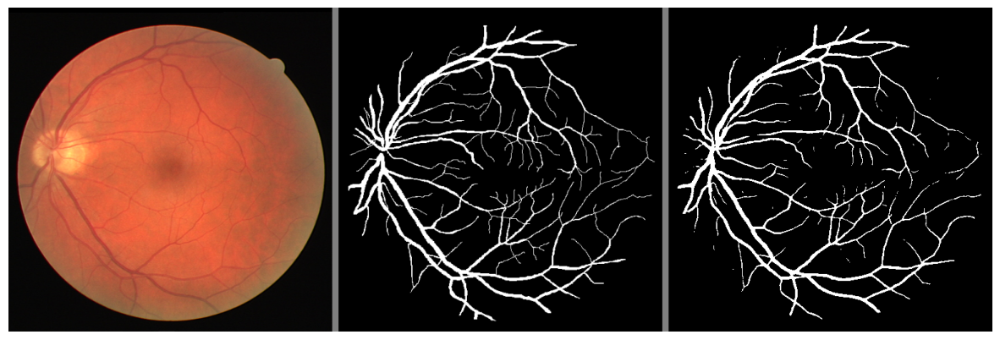

In [25]:
import matplotlib.pyplot as plt

img = plt.imread('/kaggle/working/results/11.png')
plt.figure(figsize=(15, 8))
plt.imshow(img)
plt.axis('off')

plt.show()


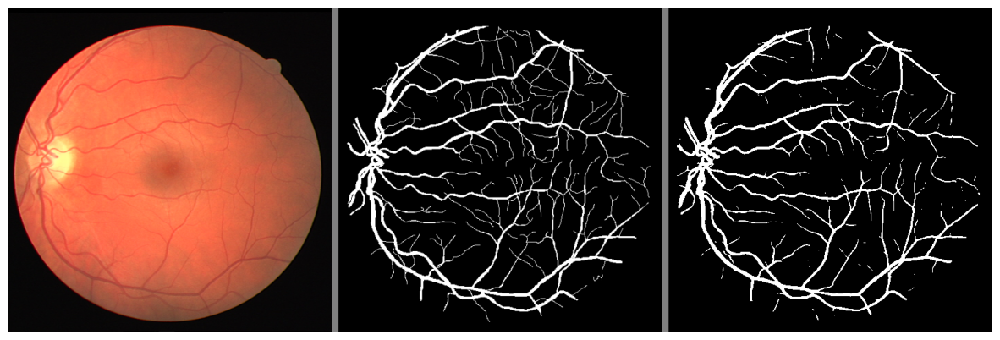

In [26]:
img = plt.imread('/kaggle/working/results/10.png')
plt.figure(figsize=(15, 8))
plt.imshow(img)
plt.axis('off')

plt.show()

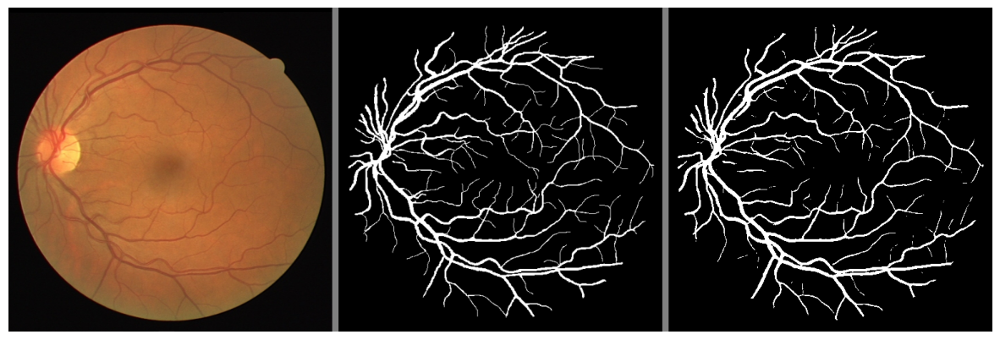

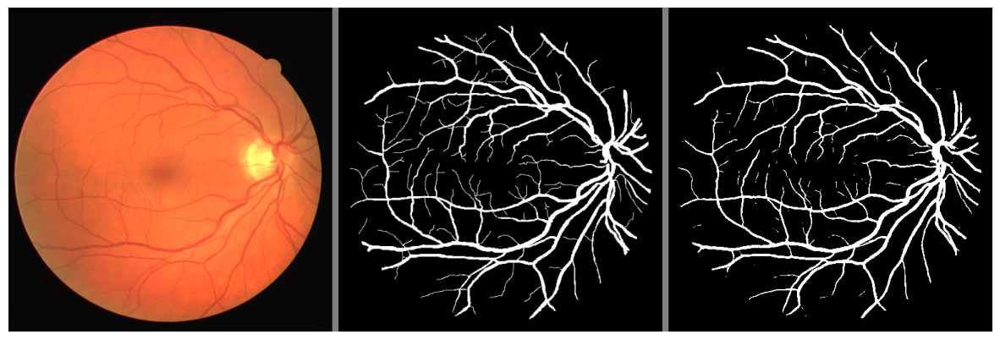

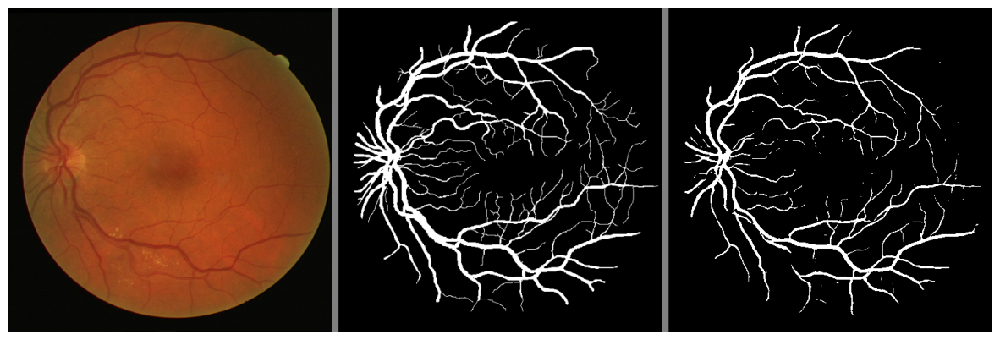

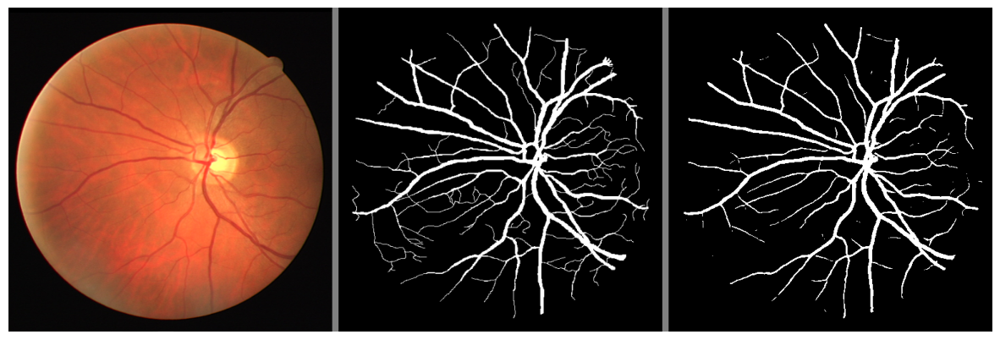

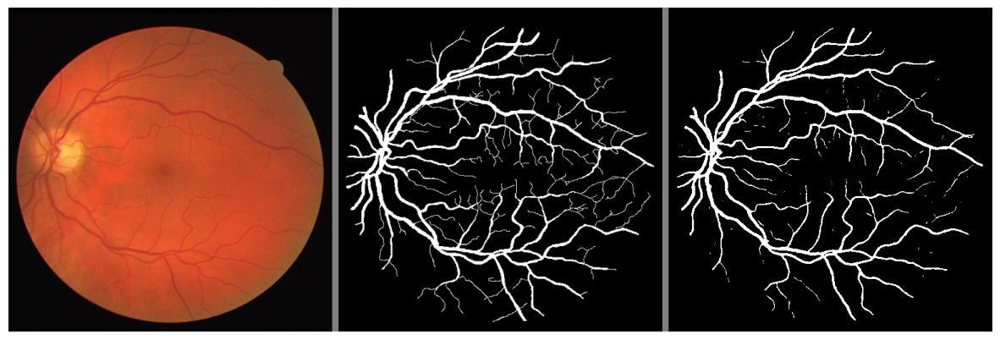

...

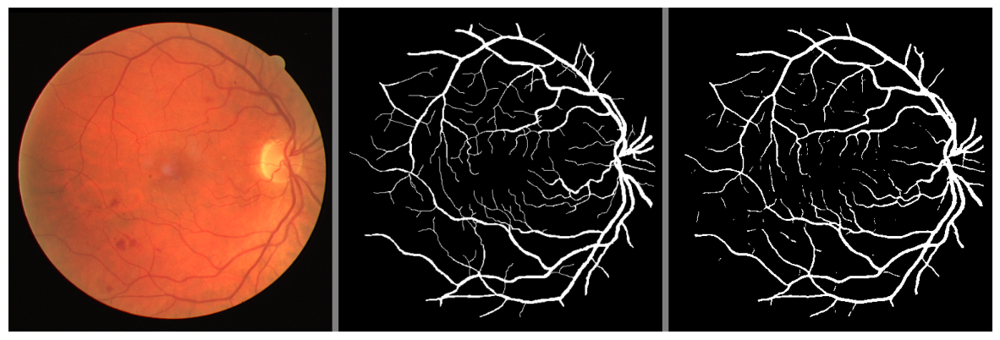

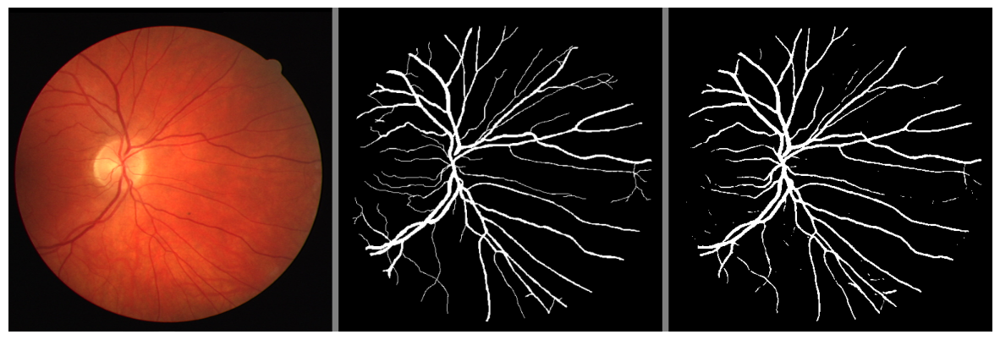

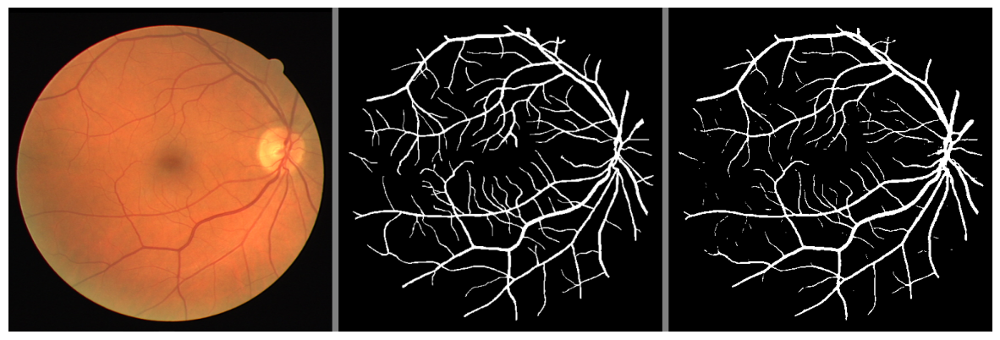

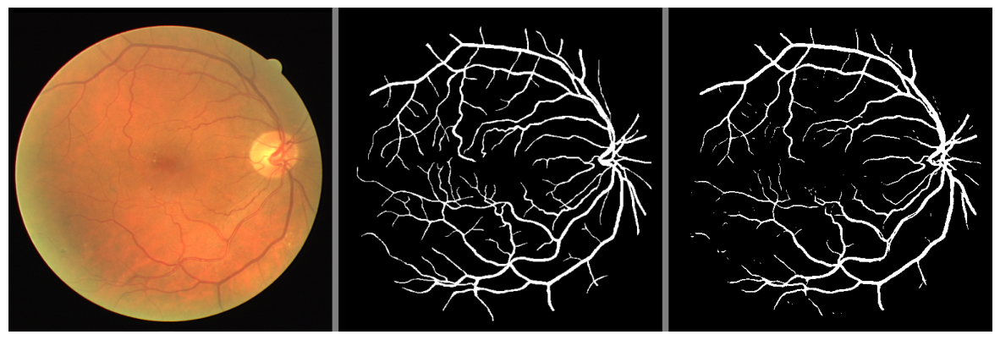

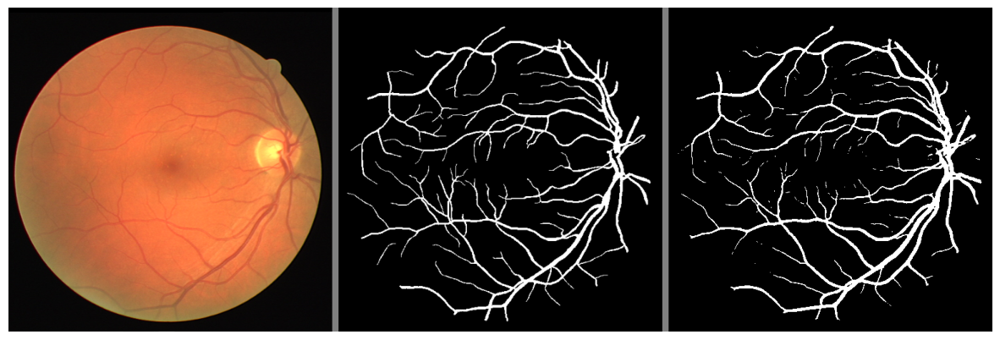

In [28]:
for x in range(18):
    img = plt.imread(f"/kaggle/working/results/{x}.png")
    plt.figure(figsize=(15, 8))
    plt.imshow(img)
    plt.axis('off')

    plt.show()

# Aptos dataset conversion

In [23]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Test paths
test_images = [
    '/kaggle/input/aptos2019/test_images/test_images/e4dcca36ceb4.png',
    '/kaggle/input/aptos2019/test_images/test_images/e4f12411fd85.png'
]

In [24]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.load('/kaggle/input/blood_vessel_segmentation_pytrch/pytorch/default/1/blood_vessel_model_full.pth', 
                  map_location=device)
model.eval()

build_unet(
  (e1): encoder_block(
    (conv): conv_block(
      (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (pool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (e2): encoder_block(
    (conv): conv_block(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (pool): MaxPool2d(kernel_size=(2, 2

In [25]:
def preprocess_image(image_path):
    # Read image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    # Resize to 512x512
    image = cv2.resize(image, (512, 512))
    # Normalize
    image = image/255.0
    # Transpose to channel-first format
    image = np.transpose(image, (2, 0, 1))
    # Add batch dimension
    image = np.expand_dims(image, axis=0)
    # Convert to tensor
    image = torch.from_numpy(image).float()
    return image

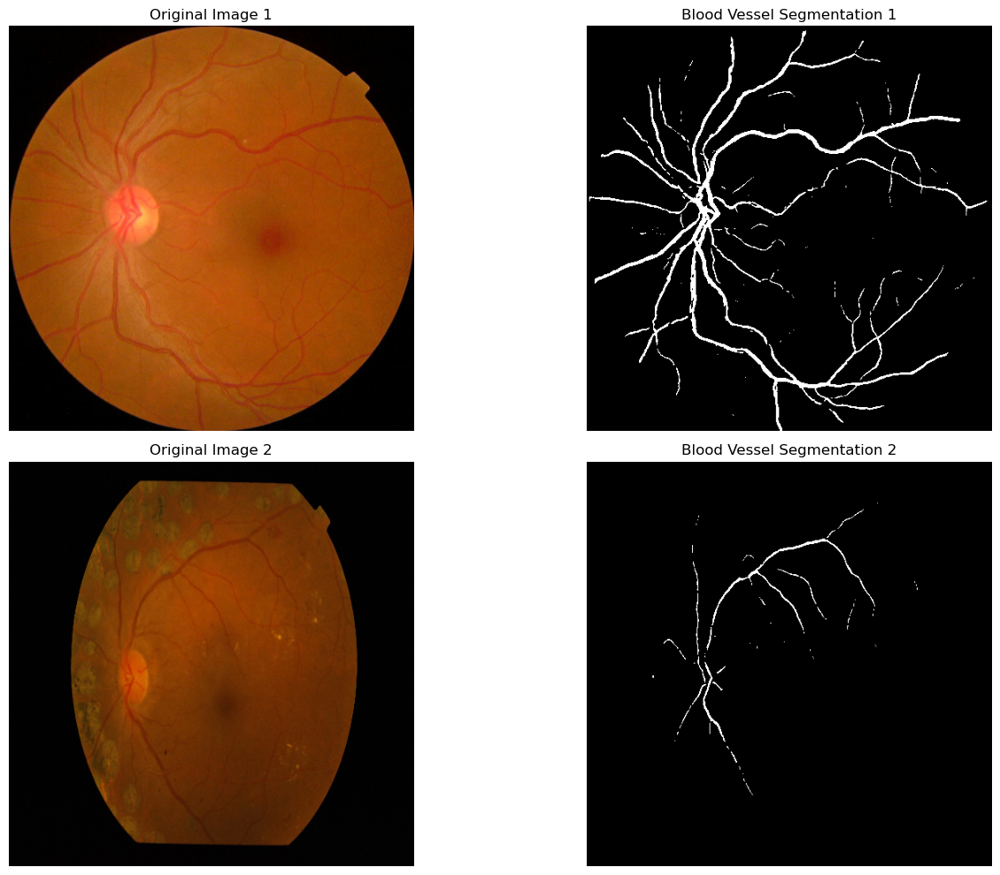

In [26]:
plt.figure(figsize=(15, 10))
for idx, img_path in enumerate(test_images):
    # Preprocess image
    x = preprocess_image(img_path)
    x = x.to(device)
    
    # Get prediction
    with torch.no_grad():
        pred = model(x)
        pred = torch.sigmoid(pred)
        pred = pred.cpu().numpy()
        pred = (pred > 0.5).astype(np.uint8)
        pred = np.squeeze(pred)
    
    # Original image for display
    original = cv2.imread(img_path)
    original = cv2.resize(original, (512, 512))
    original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    
    # Display
    plt.subplot(2, 2, idx*2 + 1)
    plt.imshow(original)
    plt.title(f'Original Image {idx+1}')
    plt.axis('off')
    
    plt.subplot(2, 2, idx*2 + 2)
    plt.imshow(pred, cmap='gray')
    plt.title(f'Blood Vessel Segmentation {idx+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [27]:
from tqdm import tqdm

# Test with these two images
test_images = [
    '/kaggle/input/aptos2019/test_images/test_images/e4dcca36ceb4.png',
    '/kaggle/input/aptos2019/test_images/test_images/e4f12411fd85.png'
]

In [28]:
output_dir = '/kaggle/working/blood_vessel_segmentations'
os.makedirs(output_dir, exist_ok=True)


Processing: e4dcca36ceb4.png

Processing: e4f12411fd85.png


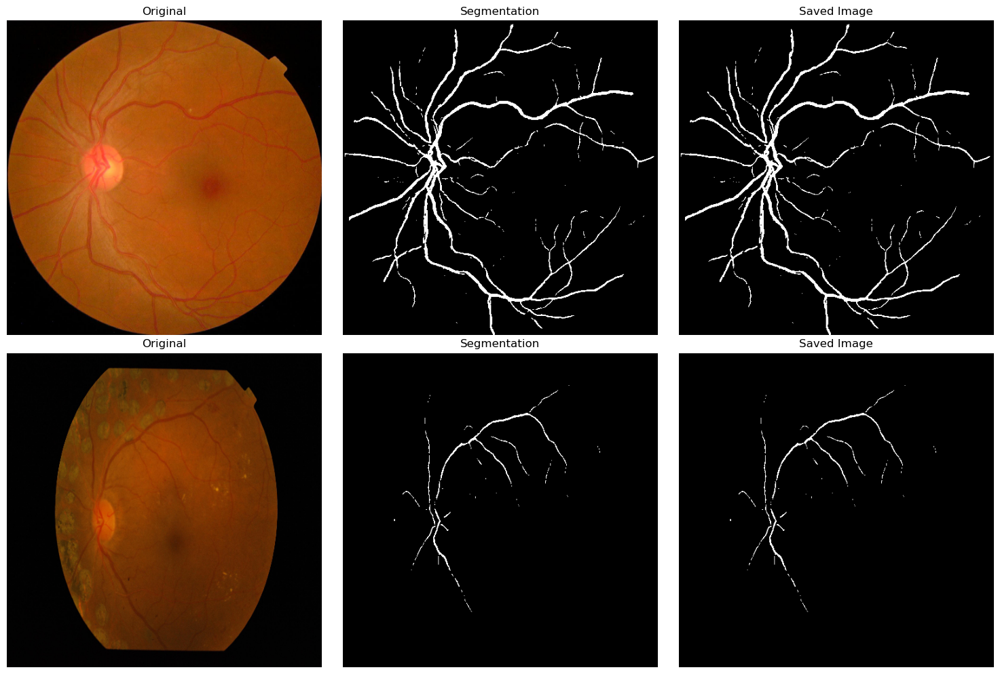


Test segmentations saved in: /kaggle/working/blood_vessel_segmentations
Files saved:
- e4f12411fd85.png
- e4dcca36ceb4.png


In [29]:
def process_and_save_image(image_path, save_dir):
    # Get original filename
    filename = os.path.basename(image_path)
    
    # Read and preprocess image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (512, 512))
    
    # Prepare for model
    img_input = image/255.0
    img_input = np.transpose(img_input, (2, 0, 1))
    img_input = np.expand_dims(img_input, axis=0)
    img_input = torch.from_numpy(img_input).float().to(device)
    
    # Get prediction
    with torch.no_grad():
        pred = model(img_input)
        pred = torch.sigmoid(pred)
        pred = pred.cpu().numpy()
        pred = (pred > 0.5).astype(np.uint8)
        pred = np.squeeze(pred) * 255  # Convert to 0-255 range
    
    # Save the segmentation
    save_path = os.path.join(save_dir, filename)
    cv2.imwrite(save_path, pred)
    
    return image, pred

# Process test images and display results
plt.figure(figsize=(15, 10))
for idx, img_path in enumerate(test_images):
    print(f"\nProcessing: {os.path.basename(img_path)}")
    
    # Process and save
    original, segmentation = process_and_save_image(img_path, output_dir)
    save_path = os.path.join(output_dir, os.path.basename(img_path))
    
    # Display
    plt.subplot(2, 3, idx*3 + 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')
    
    plt.subplot(2, 3, idx*3 + 2)
    plt.imshow(segmentation, cmap='gray')
    plt.title('Segmentation')
    plt.axis('off')
    
    # Load and display saved image to verify
    saved_seg = cv2.imread(save_path, cv2.IMREAD_GRAYSCALE)
    plt.subplot(2, 3, idx*3 + 3)
    plt.imshow(saved_seg, cmap='gray')
    plt.title('Saved Image')
    plt.axis('off')

plt.tight_layout()
plt.show()

print("\nTest segmentations saved in:", output_dir)
print("Files saved:")
for f in os.listdir(output_dir):
    print(f"- {f}")

In [31]:
output_dir = '/kaggle/working/blood_vessel_segmentations'
os.makedirs(output_dir, exist_ok=True)

input_dir = '/kaggle/input/aptos2019/train_images/train_images'

In [32]:
def process_image(image_path):
    # Read and preprocess image
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, (512, 512))
    
    # Prepare for model
    img_input = image/255.0
    img_input = np.transpose(img_input, (2, 0, 1))
    img_input = np.expand_dims(img_input, axis=0)
    img_input = torch.from_numpy(img_input).float().to(device)
    
    # Get prediction
    with torch.no_grad():
        pred = model(img_input)
        pred = torch.sigmoid(pred)
        pred = pred.cpu().numpy()
        pred = (pred > 0.5).astype(np.uint8)
        pred = np.squeeze(pred) * 255
    
    return pred

# Get list of all images
image_files = [f for f in os.listdir(input_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]

print(f"Found {len(image_files)} images to process.")
print("Starting segmentation process...")

# Process all images with progress bar
for img_name in tqdm(image_files):
    try:
        # Get full paths
        input_path = os.path.join(input_dir, img_name)
        output_path = os.path.join(output_dir, img_name)
        
        # Process image
        segmentation = process_image(input_path)
        
        # Save segmentation with original filename
        cv2.imwrite(output_path, segmentation)
        
    except Exception as e:
        print(f"\nError processing {img_name}: {str(e)}")
        continue

print("\nProcessing complete!")
print(f"Segmented images saved to: {output_dir}")
print(f"Total images processed: {len(os.listdir(output_dir))}")

Found 2930 images to process.
Starting segmentation process...


100%|██████████| 2930/2930 [08:51<00:00,  5.52it/s]


Processing complete!
Segmented images saved to: /kaggle/working/blood_vessel_segmentations
Total images processed: 2932


In [33]:
!zip -r file.zip /kaggle/working

  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/.virtual_documents/ (stored 0%)
  adding: kaggle/working/blood_vessel_model.onnx (deflated 8%)
  adding: kaggle/working/files/ (stored 0%)
  adding: kaggle/working/files/checkpoint.pth (deflated 8%)
  adding: kaggle/working/blood_vessel_model_full.pth (deflated 8%)
  adding: kaggle/working/blood_vessel_segmentations/ (stored 0%)
  adding: kaggle/working/blood_vessel_segmentations/b86fb2d5be1a.png (deflated 14%)
  adding: kaggle/working/blood_vessel_segmentations/78937523f7a8.png (deflated 13%)
  adding: kaggle/working/blood_vessel_segmentations/91a88d3b0358.png (deflated 28%)
  adding: kaggle/working/blood_vessel_segmentations/abf09c44d5f4.png (deflated 12%)
  adding: kaggle/working/blood_vessel_segmentations/49e4b95ee2dc.png (deflated 23%)
  adding: kaggle/working/blood_vessel_segmentations/6c6505a0c637.png (deflated 60%)
  adding: kaggle/working/blood_vessel_segmentations/4e54ccfd49b2.png (deflated 12%)
  adding: kaggle/w

In [34]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip